## Assignment-1 Human Activity Recognition (HAR)
### This is our first assignment of ES-335 Machine Learning Course
### Team members are:

1. Lakshya Kesarwani (23110187)
2. Naveen Pal (23110216)
3. Manan Chavda (23110078)

**Here first we are importing important libraries used all over the project.**

In [75]:
import os
import tsfel
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from MakeDataset import X_train,X_test,y_train,y_test
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
%config InlineBackend.figure_format = 'retina'
from IPython.display import display, HTML
%matplotlib inline

In [76]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((126, 500, 3), (54, 500, 3), (126,), (54,))

**MakDataset.py contains the code to split the Complete dataset of 180 subjects to Training Data and Test Data**

<!-- **We are taking total accleration**
$$ a = a_x^2 + a_y^2 + az^2 $$ -->

In [2]:
mg_x_train = (np.sum(np.square(X_train), axis=2))
mg_x_test = (np.sum(np.square(X_test), axis=2))
print(mg_x_train.shape,y_train.shape,mg_x_test.shape,y_test.shape)

(126, 500) (126,) (54, 500) (54,)


# TASK-1 Exploratory Data Analysis (EDA)

**Question 1** \
*Plot the waveform for one sample data from each activity class. Are you able to see any difference/similarities between the activities? You can plot a subplot having 6 columns to show differences/similarities between the activities. Do you think the model will be able to classify the activities based on the data?*

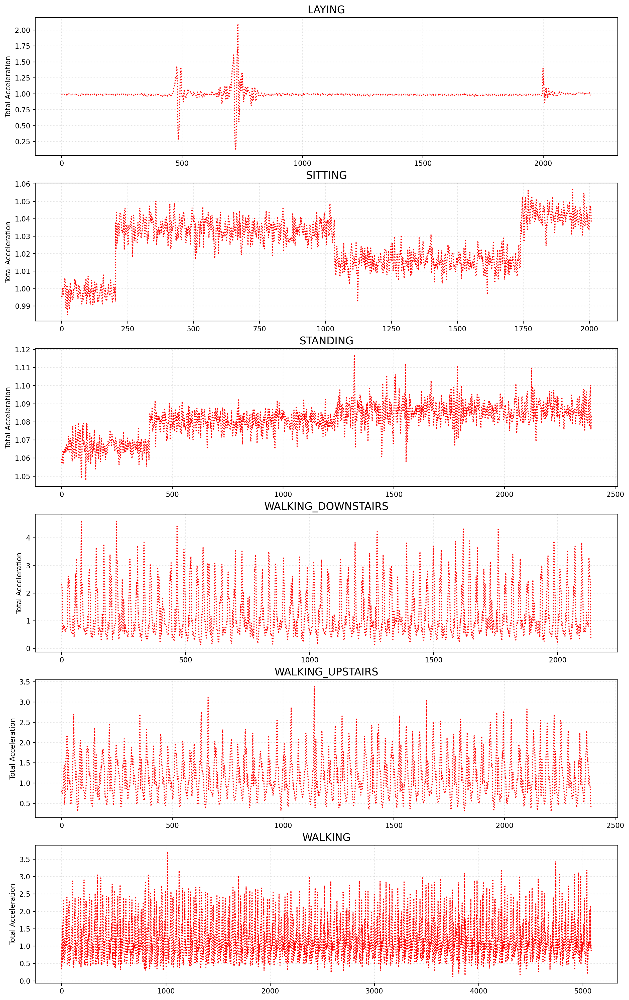

In [3]:
def calc_accn(file_path):
    df = pd.read_csv(file_path)
    df['total_acceleration'] = (df['accx']**2 + df['accy']**2 + df['accz']**2)
    return df['total_acceleration'].values

def get_accn(folders):
    list_accelerations = []
    folder_names = []
    for folder in folders:
        file_path = os.path.join(folder, 'Subject_1.csv')
        accn_array = calc_accn(file_path)
        list_accelerations.append(accn_array)
        folder_names.append((folder)[17:-1])
    return list_accelerations, folder_names

def plot_accns(total_accelerations, folder_names):
    num_folders = len(total_accelerations)
    fig, axes = plt.subplots( num_folders,1, figsize=(15,25), squeeze=False)
    for i, (acceleration_array, folder_name) in enumerate(zip(total_accelerations, folder_names)):
        axes[i,0].plot(acceleration_array[500:-500],color='red', linestyle=':')
        axes[i,0].set_title(folder_name, fontsize=15, color='black')
        # axes[i,0].set_xlabel('index')
        axes[i,0].set_ylabel('Total Acceleration')
        axes[i,0].grid(True, linestyle=':', color='gray', alpha=0.25) 
    plt.show()

folders = [
    "./Combined/Train/LAYING/",
    "./Combined/Train/SITTING/",
    "./Combined/Train/STANDING/",
    "./Combined/Train/WALKING_DOWNSTAIRS/",
    "./Combined/Train/WALKING_UPSTAIRS/",
    "./Combined/Train/WALKING/"
]

ta, fn = get_accn(folders)
plot_accns(ta, fn)


### Above, There are 6 sublplots for graphical depiction of variation of accleration w.r.t <i>Time</i> for 6 different activities.

## Additional Plots for EDA

In [4]:
stats_df = pd.DataFrame(ta)
stats_df.index = fn
(stats_df.T).describe()

,LAYING,SITTING,STANDING,WALKING_DOWNSTAIRS,WALKING_UPSTAIRS,WALKING
count,3200.000000,3008.000000,3392.000000,3136.000000,3392.000000,6080.000000
mean,0.991319,1.025961,1.079401,1.220430,1.157143,1.179971
std,0.071856,0.020434,0.010066,0.838802,0.505805,0.555776
min,0.130709,0.835356,1.043814,0.094251,0.303875,0.095970
25%,0.980883,1.014487,1.071099,0.629668,0.767520,0.763963
50%,0.986978,1.030476,1.081737,0.886059,1.069196,1.037970
75%,0.995762,1.038691,1.086498,1.664664,1.474980,1.507000
max,2.099350,1.212366,1.117018,4.633535,3.397191,3.725185



\
Here we can see that ***mean accleration*** of all the activities are ***almost same*** \
with ***mean and standard deviation*** of  walking-downstairs, walking-upstairs, walking ***slightly more than*** laying, stting, standing \
which justifies the amount of movement required for every corresponding activity.


Also, we can notice that max value of accleration for walking-downstairs, walking-upstairs, walking is comparatively large.

In [5]:
truncated_data = [data[2600:3000] for data in ta]

\
Now to perform some analysis on all the activities, we'll use truncated data as every activity used above has different number of samples.

In [6]:
plt.figure(figsize=(80, 48))
for i, data in enumerate(truncated_data, start=1):
    plt.plot(np.linspace(2601,3000,400),data, label=fn[i-1],linewidth=8)
plt.gcf().patch.set_facecolor('lightcyan')

plt.xlabel('Index',fontsize = 80)
plt.ylabel('Acceleration',fontsize = 80)
plt.title('Acceleration Data Comparison',fontsize = 80)
plt.yticks(fontsize=50)
plt.xticks(fontsize=50)
plt.legend(fontsize=75)
plt.grid(True)
plt.show()


This graph clearly shows that there is large variation in accleration of activities like walking-downstairs, walking-upstairs, walking
\
\
<br>
<br>

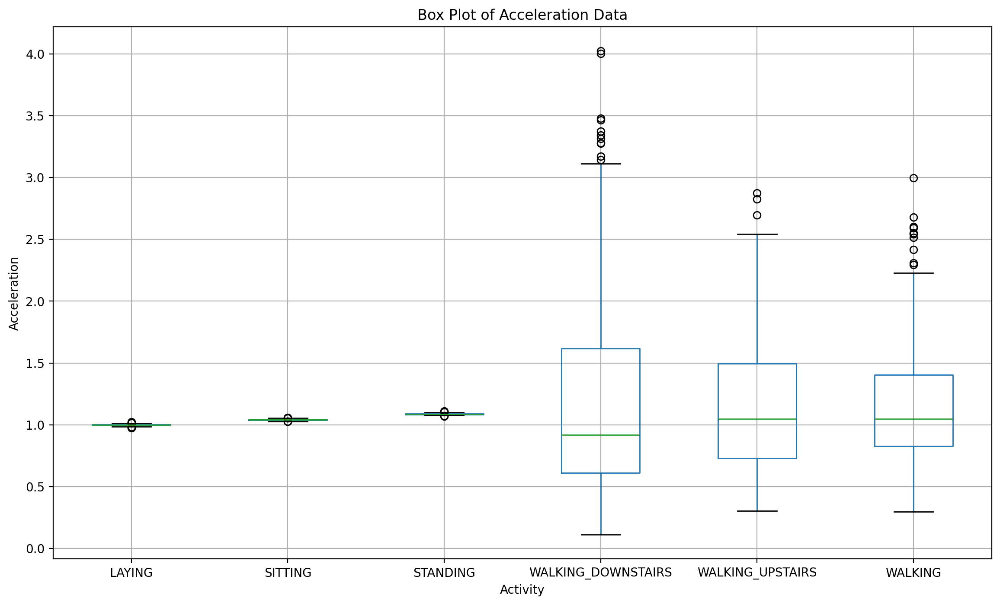

In [7]:
data_df = pd.DataFrame(truncated_data).T
data_df.columns = [fn[i] for i in range(len(truncated_data))]

plt.figure(figsize=(14, 8))
data_df.boxplot()
plt.xlabel('Activity')
plt.ylabel('Acceleration')
plt.title('Box Plot of Acceleration Data')
plt.grid(True)
plt.show()


This plot explains data distribution through five-number summary: minimum, first quartile (Q1), median, third quartile (Q3), and maximum.
Here we can visualize that, the  data for walking-downstairs, walking-upstairs, walking has many outliers, \
also the activities like laying, stting, standing varies within a very small range 
<br>
<br><br>
<br>

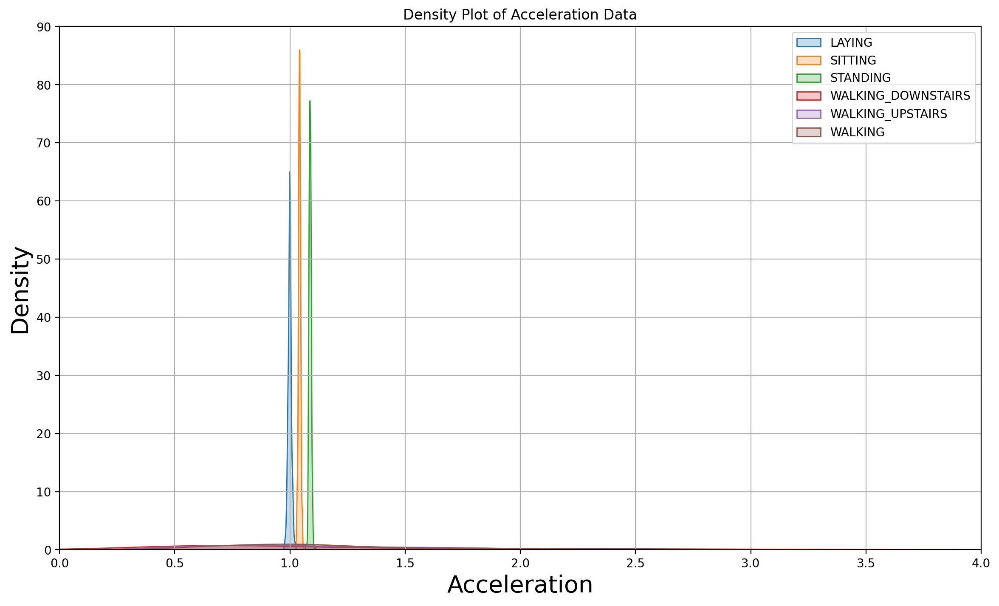

In [8]:
plt.figure(figsize=(14, 8))
for i, data in enumerate(truncated_data, start=1):
    sns.kdeplot(data, label=fn[i-1], fill=True)
plt.xlabel('Acceleration',fontsize=20)
plt.ylabel('Density',fontsize=20)
plt.title('Density Plot of Acceleration Data')
plt.ylim(0,90)
plt.xlim(0,4)
plt.legend()
plt.grid(True)
plt.show()

This plot very well illustrates how widely the acceleration values are distributed for walking-downstairs, walking-upstairs, walking. Also, plot has a high peak at a certain value close to 1, it means most of the (nearly all) data points have acceleration values near that peak.
<br>
<br><br>
<br>

**Question 2** \
Do you think we need a machine learning model to differentiate between static activities (laying, sitting, standing) and dynamic activities(walking, walking_downstairs, walking_upstairs)? Look at the linear acceleration\
$$a = a_x^2 + a_y^2 + a_z^2$$
for each activity and justify your answer.justify your answer.

**Answer :** No, we don’t need a machine learning model to differentiate between static (laying, sitting, standing) and dynamic (walking, walking downstairs, walking upstairs) activities, as basic statistical measures of linear acceleration can suffice. However, machine learning is valuable for distinguishing between activities within each category, as it can handle the subtle variations and complex patterns in the data.

**Question 3**

Here we'll use PCA over different set of features 

## Visualize the data using PCA.

**Part a :** \
Use PCA (Principal Component Analysis) on Total Acceleration $a = a_x^2 + a_y^2 + a_z^2$ to compress the acceleration timeseries into two features and plot a scatter plot to visualize different class of activities.

In [9]:
class_labels =  {1:"WALKING", 
                 2:"WALKING_UPSTAIRS",
                 3:"WALKING_DOWNSTAIRS",
                 4:"SITTING",
                 5:"STANDING",
                 6:"LAYING"}
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']
labels = list(class_labels.keys())  

In [10]:
X = mg_x_train  
classes = y_train  

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Class'] = classes


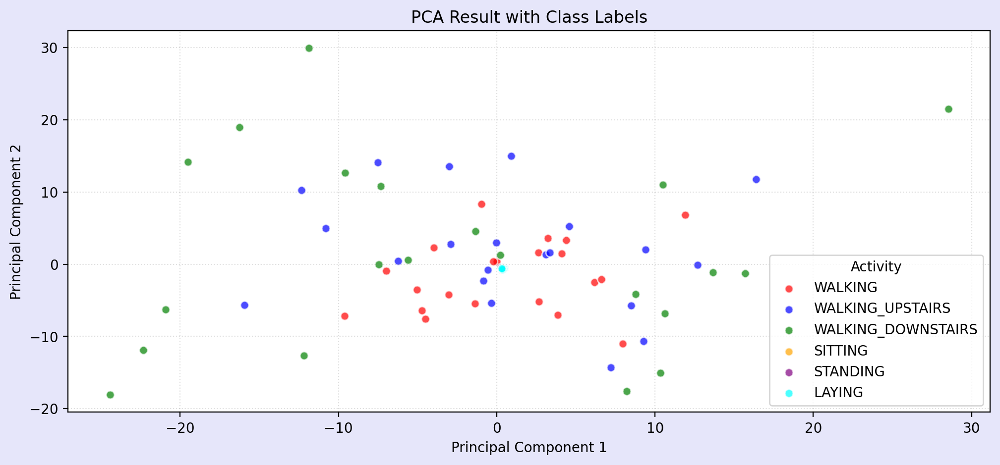

In [11]:
plt.figure(figsize=(12, 5))
plt.gcf().patch.set_facecolor('lavender')
for i, class_label in enumerate(sorted(pca_df['Class'].unique())):
    class_data = pca_df[pca_df['Class'] == class_label]
    plt.scatter(class_data['PC1'], class_data['PC2'], 
                color=colors[i], 
                label=class_labels[class_label],  # Use class names
                alpha=0.7, 
                edgecolors='white')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Result with Class Labels')
plt.legend(title='Activity')
plt.grid(True, linestyle=':', color='gray', alpha=0.25)
plt.show()


Here it is visible that data points for laying (after normalising) is close to zero 
<br>
<br>

**Part 2 :**
Next, use TSFEL (a featurizer library) to create features (your choice which ones you feel are useful) and then perform PCA to obtain two features. Plot a scatter plot to visualize different class of activities.

In [12]:
dd = pd.DataFrame(mg_x_train)
dd

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,2.005249,2.160400,2.273817,2.109540,1.480720,1.188538,1.236224,1.148906,1.224590,1.404729,...,1.171789,1.120623,1.052254,0.897080,0.634980,0.462812,0.392290,0.366865,0.404079,0.471275
1,1.013713,1.020845,1.025296,1.027185,1.024007,1.022594,1.026870,1.027072,1.027742,1.027175,...,1.023928,1.030065,1.015616,0.998280,1.006388,1.013092,1.003704,1.011527,1.021394,1.019440
2,1.061579,1.068788,1.076640,1.081619,1.083677,1.089191,1.088519,1.077718,1.072226,1.073787,...,1.065313,1.069200,1.072072,1.072758,1.069753,1.067005,1.067372,1.070067,1.071565,1.065639
3,0.497171,0.558901,0.629017,0.762178,0.754270,0.740479,0.920398,1.090739,1.126387,1.029941,...,1.385321,1.739091,2.384820,2.673074,2.355472,1.995429,1.663886,1.391880,1.428507,1.302203
4,0.526393,0.612953,0.625144,0.617296,0.654806,0.651206,0.767416,0.867818,0.892692,1.003664,...,0.761745,0.679142,0.652467,0.642199,0.636815,0.576609,0.510688,0.563943,0.613582,0.627226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,1.667010,1.683330,1.400401,1.398746,1.443760,1.429334,1.422312,1.272041,1.266330,1.635466,...,0.556597,0.625043,0.718228,0.822178,0.822011,0.734799,0.777650,0.816605,0.869754,1.036154
122,1.030068,1.028156,1.026852,1.031123,1.030664,1.027787,1.030023,1.028752,1.024007,1.024407,...,0.997455,1.003453,1.005665,0.999863,0.990790,0.992914,0.997406,0.995081,0.997205,1.003835
123,1.017618,1.015693,1.008254,1.003586,1.007235,1.019632,1.024020,1.018601,1.018554,1.022413,...,1.012313,1.017458,1.010752,1.007533,1.003922,0.996629,1.002241,1.006147,1.008498,1.019451
124,0.737070,0.742623,0.612213,0.611427,0.618866,0.576885,0.663982,0.715187,0.761910,0.818487,...,0.715990,0.735479,0.709034,0.721843,0.720080,0.607252,0.565186,0.529487,0.528832,0.512845


In [13]:
cfg = tsfel.get_features_by_domain()  
features_list = []

for i in range(dd.shape[0]):
    
    X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))
    features_list.append(X_tsfel.values.flatten())
     
tsfel_col = X_tsfel.columns
X_tsfel_df = pd.DataFrame(features_list,columns=tsfel_col)


if X_tsfel_df.shape[1] > 100:
    X_tsfel_df = X_tsfel_df.iloc[:, :100]

*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3796740713.py:6: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array(dd.iloc[i]))



*** Feature extraction finished ***


In [14]:
print(f"Shape of the data {X_tsfel_df.shape}")
X_tsfel_df.head()

Shape of the data (126, 100)


,0_Absolute energy,0_Area under the curve,0_Autocorrelation,0_Average power,0_Centroid,0_ECDF Percentile Count_0,0_ECDF Percentile Count_1,0_ECDF Percentile_0,0_ECDF Percentile_1,0_ECDF_0,...,0_FFT mean coefficient_161,0_FFT mean coefficient_162,0_FFT mean coefficient_163,0_FFT mean coefficient_164,0_FFT mean coefficient_165,0_FFT mean coefficient_166,0_FFT mean coefficient_167,0_FFT mean coefficient_168,0_FFT mean coefficient_169,0_FFT mean coefficient_17
0,797.157180,5.735205,5.0,159.750938,2.484902,100.0,400.0,0.712381,1.496676,0.002,...,2.983955e-05,1.219236e-04,1.346450e-04,1.558463e-04,3.463696e-05,8.992139e-06,9.971816e-05,4.306714e-05,6.479226e-05,1.853266e-02
1,516.565926,5.071844,2.0,103.520226,2.494587,100.0,400.0,1.009762,1.022686,0.002,...,2.806980e-07,5.872104e-07,2.177889e-07,8.034546e-08,9.018395e-08,7.898906e-08,2.567036e-07,1.455383e-08,1.398113e-07,4.893864e-07
2,570.211290,5.328796,2.0,114.270800,2.494760,100.0,400.0,1.062823,1.072469,0.002,...,2.041898e-07,3.668389e-09,5.163884e-08,4.966502e-08,9.027530e-08,4.329091e-08,4.335265e-09,1.803498e-07,1.334364e-07,4.466201e-06
3,813.816013,5.705873,4.0,163.089381,2.509406,100.0,400.0,0.710895,1.426935,0.002,...,2.540553e-04,4.154913e-04,1.021695e-04,3.442997e-05,8.176745e-06,1.815001e-04,2.549522e-04,1.428833e-04,3.847447e-04,1.742656e-02
4,829.804651,5.766948,5.0,166.293517,2.499975,100.0,400.0,0.625144,1.663006,0.002,...,4.588906e-04,4.550202e-05,2.279659e-04,7.827735e-05,6.612015e-05,1.365122e-04,1.623368e-04,1.332925e-04,9.972636e-06,2.053604e-01


In [15]:
X = X_tsfel_df  
classes = y_train  

scaler = StandardScaler()
X_scaled_tsfel = scaler.fit_transform(X)

pca_tsfel = PCA(n_components=2)
X_pca_tsfel = pca.fit_transform(X_scaled_tsfel)

pca_df_tsfel = pd.DataFrame(X_pca_tsfel, columns=['PC1', 'PC2'])
pca_df_tsfel['Class'] = classes

Data on the extracting features from tsfel and performing PCA to reduce its dimensions

In [16]:
pca_df_tsfel,pca_df_tsfel.describe()  

(          PC1       PC2  Class
 0   -0.523698 -0.212350      2
 1   -4.467086  0.288852      6
 2   -4.318351  0.249166      5
 3    2.143241 -0.861844      2
 4    1.413982 -0.954440      2
 ..        ...       ...    ...
 121 -0.246922  0.453467      1
 122 -4.402613  0.301940      4
 123 -4.466928  0.287584      6
 124  4.113492 -1.149955      2
 125  1.011348  0.261348      2
 
 [126 rows x 3 columns],
                 PC1           PC2       Class
 count  1.260000e+02  1.260000e+02  126.000000
 mean  -6.167906e-17 -8.767237e-17    3.500000
 std    5.943986e+00  2.275322e+00    1.714643
 min   -4.559013e+00 -5.273209e+00    1.000000
 25%   -4.397244e+00 -3.997636e-01    2.000000
 50%   -3.510676e+00  2.559232e-01    3.500000
 75%    2.142496e+00  2.920669e-01    5.000000
 max    1.954305e+01  2.282922e+01    6.000000)

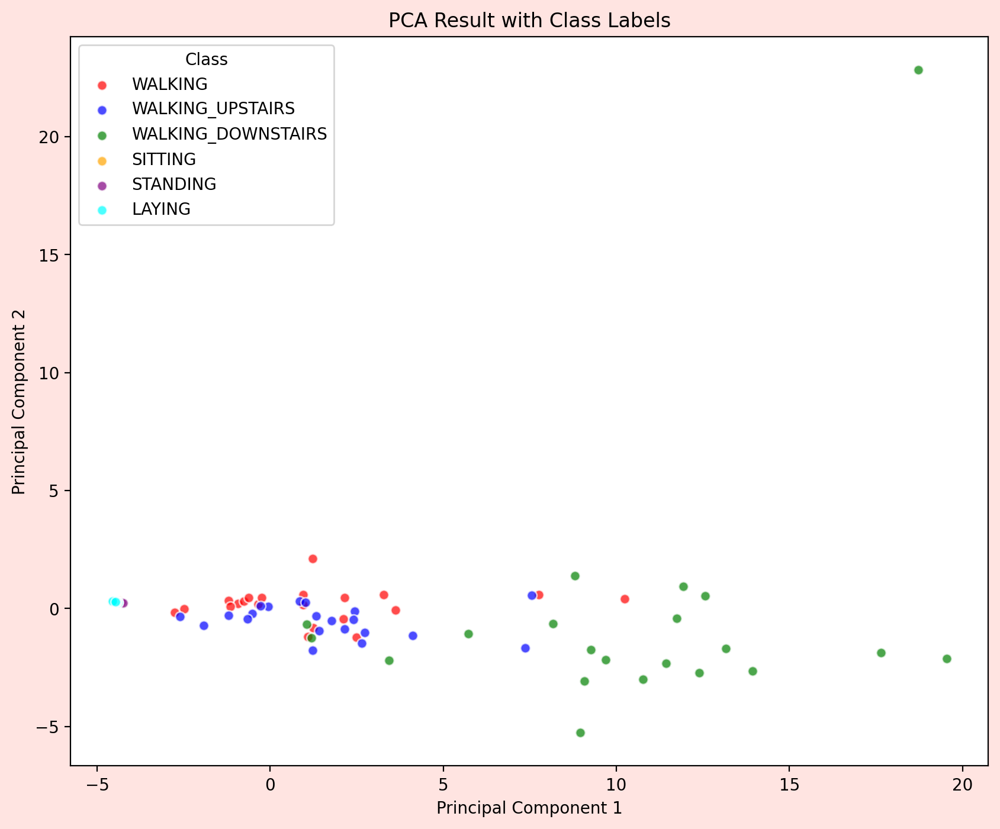

In [17]:
plt.figure(figsize=(10, 8))
plt.gcf().patch.set_facecolor('mistyrose')
for i, class_label in enumerate(sorted(pca_df_tsfel['Class'].unique())):
    class_df_tsfel = pca_df_tsfel[pca_df_tsfel['Class'] == class_label]
    plt.scatter(class_df_tsfel['PC1'], class_df_tsfel['PC2'], color=colors[i], label=class_labels[class_label],alpha=0.7,edgecolors='w')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Result with Class Labels')
plt.legend(title='Class')
plt.show()
print()

**Part c :** \
Now use the features provided by the dataset and perform PCA to obtain two features. Plot a scatter plot to visualize different class of activities.

In [18]:
features = pd.read_csv("./UCI HAR Dataset/features.txt",sep='\s+', header=None)
features.columns =["a","feature"]
features.drop("a",axis=1,inplace=True)
features.head(),features.shape
X_train_fea = pd.read_csv("./UCI HAR Dataset/train/X_train.txt", sep='\s+', header=None)
X_train_fea.columns = features.values
X_train_fea

,"(tBodyAcc-mean()-X,)","(tBodyAcc-mean()-Y,)","(tBodyAcc-mean()-Z,)","(tBodyAcc-std()-X,)","(tBodyAcc-std()-Y,)","(tBodyAcc-std()-Z,)","(tBodyAcc-mad()-X,)","(tBodyAcc-mad()-Y,)","(tBodyAcc-mad()-Z,)","(tBodyAcc-max()-X,)",...,"(fBodyBodyGyroJerkMag-meanFreq(),)","(fBodyBodyGyroJerkMag-skewness(),)","(fBodyBodyGyroJerkMag-kurtosis(),)","(angle(tBodyAccMean,gravity),)","(angle(tBodyAccJerkMean),gravityMean),)","(angle(tBodyGyroMean,gravityMean),)","(angle(tBodyGyroJerkMean,gravityMean),)","(angle(X,gravityMean),)","(angle(Y,gravityMean),)","(angle(Z,gravityMean),)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.070157,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,0.165259,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.195034,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.013865,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339


In [19]:
y_train_fea = pd.read_csv("./UCI HAR Dataset/train/y_train.txt", sep='\s+', header=None)
y_train_fea.shape

(7352, 1)

In [20]:
X = X_train_fea  
classes = y_train_fea  

scaler = StandardScaler()
X_scaled_fea = scaler.fit_transform(X)

pca_fea = PCA(n_components=2)
X_pca_fea = pca.fit_transform(X_scaled_fea)

pca_df_fea = pd.DataFrame(X_pca_fea, columns=['PC1', 'PC2'])
pca_df_fea['Class'] = classes


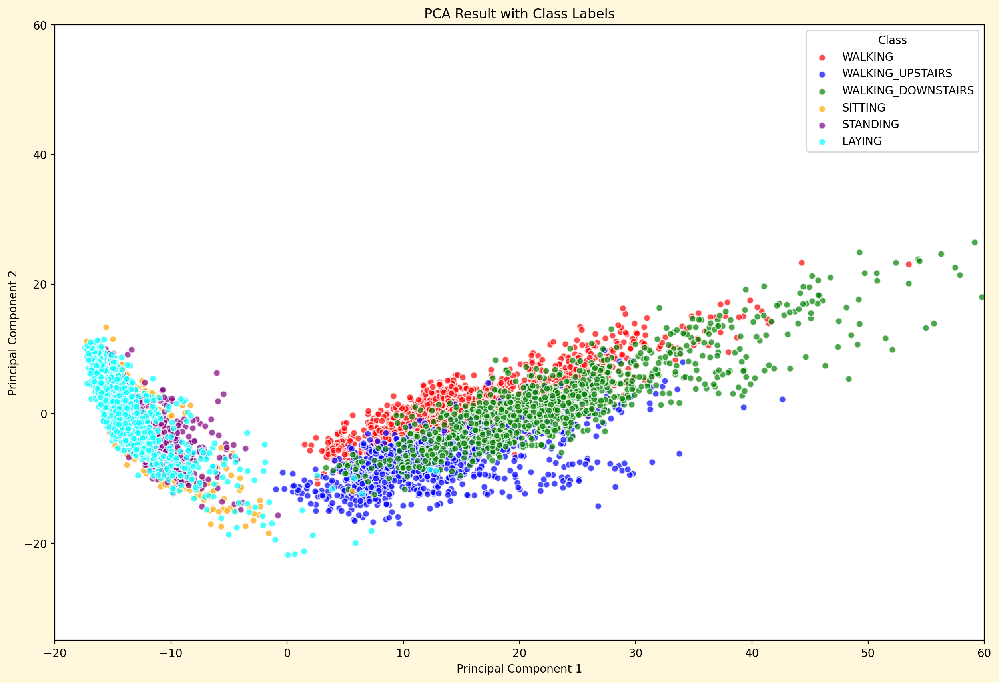

In [21]:
plt.figure(figsize=(15, 10))
plt.gcf().patch.set_facecolor('cornsilk')
for i, class_label in enumerate(sorted(pca_df_fea['Class'].unique())):
    class_df_fea = pca_df_fea[pca_df_fea['Class'] == class_label]
    plt.scatter(class_df_fea['PC1'], class_df_fea['PC2'], color=colors[i], label=class_labels[class_label],alpha=0.7,edgecolors='w')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Result with Class Labels')
plt.legend(title='Class')
plt.ylim(-35,60)
plt.xlim(-20,60)
plt.show()

**Part d :** \
Compare the results of PCA on Total Acceleration, TSFEL and the dataset features. Which method do you think is better for visualizing the data?

C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3010196927.py:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


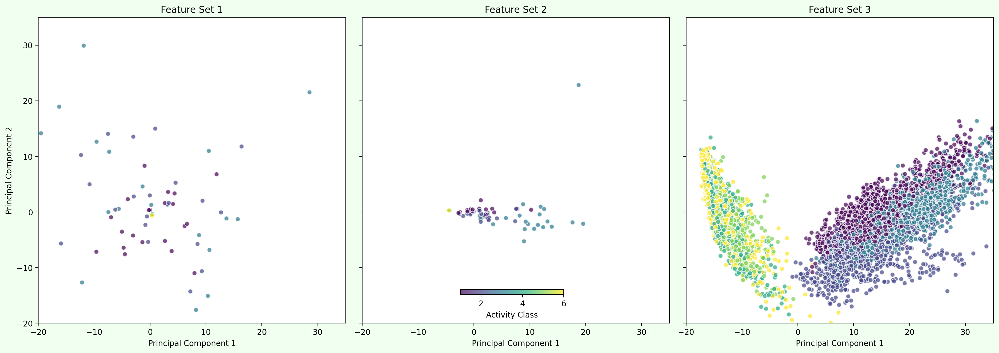

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
plt.gcf().patch.set_facecolor('honeydew')

axes[0].set_xlim(-20,35)
axes[0].set_ylim(-20,35)

axes[0].scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Class'], cmap='viridis', alpha=0.7, edgecolors='w')
axes[0].set_title('Feature Set 1')
axes[0].set_xlabel('Principal Component 1')
axes[0].set_ylabel('Principal Component 2')


axes[1].scatter(pca_df_tsfel['PC1'], pca_df_tsfel['PC2'], c=pca_df_tsfel['Class'], cmap='viridis', alpha=0.7, edgecolors='w')
axes[1].set_title('Feature Set 2')
axes[1].set_xlabel('Principal Component 1')


axes[2].scatter(pca_df_fea['PC1'], pca_df_fea['PC2'], c=pca_df_fea['Class'], cmap='viridis', alpha=0.7, edgecolors='w')
axes[2].set_title('Feature Set 3')
axes[2].set_xlabel('Principal Component 1')

cbar = plt.colorbar(axes[0].collections[0], ax=axes, orientation='horizontal', fraction=0.02, pad=0.1)
cbar.set_label('Activity Class')

plt.tight_layout()

plt.show()

Considering number of points, Third one using features provided by dataset, we  get large number data points ,so data could be very well visualized.

In [23]:
pca_df1 = pca_df
pca_df2 = pca_df_tsfel
pca_df3 = pca_df_fea

combined_df1 = pca_df1[['PC1', 'PC2']].values
combined_df2 = pca_df2[['PC1', 'PC2']].values
combined_df3 = pca_df3[['PC1', 'PC2']].values

score1 = silhouette_score(combined_df1, pca_df1['Class'])
score2 = silhouette_score(combined_df2, pca_df2['Class'])
score3 = silhouette_score(combined_df3, pca_df3['Class'])

print(f'Silhouette Score for data given: {score1}')
print(f'Silhouette Score for Feature using tsfel: {score2}')
print(f'Silhouette Score for provided Feature : {score3}')

Silhouette Score for data given: -0.14693331256057432
Silhouette Score for Feature using tsfel: 0.13406130573458797
Silhouette Score for provided Feature : 0.013897111951452821


**Silhouette Score** gives idea about how well is the cluster in each of the plot. The score provides an indication of how well-separated and compact the clusters are.
<br>
<br>

**Question 4** \
Calculate the correlation matrix of the features obtained by TSFEL and provided in the dataset. Identify the features that are highly correlated with each other. Are there any redundant features?

In [24]:
corr_tsfel = X_tsfel_df.corr()
corr_tsfel

,0_Absolute energy,0_Area under the curve,0_Autocorrelation,0_Average power,0_Centroid,0_ECDF Percentile Count_0,0_ECDF Percentile Count_1,0_ECDF Percentile_0,0_ECDF Percentile_1,0_ECDF_0,...,0_FFT mean coefficient_161,0_FFT mean coefficient_162,0_FFT mean coefficient_163,0_FFT mean coefficient_164,0_FFT mean coefficient_165,0_FFT mean coefficient_166,0_FFT mean coefficient_167,0_FFT mean coefficient_168,0_FFT mean coefficient_169,0_FFT mean coefficient_17
0_Absolute energy,1.000000,0.961868,-0.055918,1.000000,-0.125637,NaN,NaN,-0.933777,0.959643,NaN,...,0.736896,0.773967,0.535009,0.580137,0.608854,0.664102,0.620194,0.547960,0.556332,0.465477
0_Area under the curve,0.961868,1.000000,-0.075745,0.961868,-0.077645,NaN,NaN,-0.926825,0.965429,NaN,...,0.631645,0.691452,0.455325,0.543321,0.564050,0.593731,0.565405,0.548032,0.532942,0.460090
0_Autocorrelation,-0.055918,-0.075745,1.000000,-0.055918,-0.099617,NaN,NaN,0.031643,-0.048502,NaN,...,-0.028714,-0.033330,-0.021613,-0.025048,-0.029529,-0.033382,-0.031951,-0.027239,-0.022205,-0.020124
0_Average power,1.000000,0.961868,-0.055918,1.000000,-0.125637,NaN,NaN,-0.933777,0.959643,NaN,...,0.736896,0.773967,0.535009,0.580137,0.608854,0.664102,0.620194,0.547960,0.556332,0.465477
0_Centroid,-0.125637,-0.077645,-0.099617,-0.125637,1.000000,NaN,NaN,0.129720,-0.088423,NaN,...,-0.213230,-0.031101,-0.162186,0.039966,-0.223063,-0.288170,-0.216507,-0.025890,-0.045422,0.290063
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0_FFT mean coefficient_166,0.664102,0.593731,-0.033382,0.664102,-0.288170,NaN,NaN,-0.614561,0.600574,NaN,...,0.560463,0.463512,0.488338,0.390937,0.473108,1.000000,0.552260,0.409600,0.339160,0.133574
0_FFT mean coefficient_167,0.620194,0.565405,-0.031951,0.620194,-0.216507,NaN,NaN,-0.576341,0.559589,NaN,...,0.373017,0.569225,0.327166,0.380016,0.295075,0.552260,1.000000,0.413366,0.436738,0.170272
0_FFT mean coefficient_168,0.547960,0.548032,-0.027239,0.547960,-0.025890,NaN,NaN,-0.549069,0.558450,NaN,...,0.273214,0.456432,0.395707,0.394866,0.424449,0.409600,0.413366,1.000000,0.778337,0.221461
0_FFT mean coefficient_169,0.556332,0.532942,-0.022205,0.556332,-0.045422,NaN,NaN,-0.546996,0.544171,NaN,...,0.310948,0.501324,0.417100,0.346199,0.461916,0.339160,0.436738,0.778337,1.000000,0.243770


In [25]:
highly_correlated_pairs = np.where(np.abs(corr_tsfel) > 0.8)
highly_correlated_pairs = [(corr_tsfel.index[x], corr_tsfel.columns[y]) 
                           for x, y in zip(*highly_correlated_pairs) 
                           if x != y and x < y]
features_x = []
features_y = []
correlations = []

for (x, y) in highly_correlated_pairs:
    features_x.append(x)
    features_y.append(y)
    correlations.append(corr_tsfel.loc[x, y])

# Create a DataFrame with the results
correlation_df = pd.DataFrame({
    'Feature_X': features_x,
    'Feature_Y': features_y,
    'Correlation': correlations
})
correlation_df.sort_values("Correlation")


,Feature_X,Feature_Y,Correlation
9,0_ECDF Percentile_0,0_ECDF Percentile_1,-0.955879
2,0_Absolute energy,0_ECDF Percentile_0,-0.933777
7,0_Average power,0_ECDF Percentile_0,-0.933777
5,0_Area under the curve,0_ECDF Percentile_0,-0.926825
10,0_FFT mean coefficient_105,0_FFT mean coefficient_153,0.829028
11,0_FFT mean coefficient_114,0_FFT mean coefficient_155,0.829759
12,0_FFT mean coefficient_121,0_FFT mean coefficient_155,0.842494
3,0_Absolute energy,0_ECDF Percentile_1,0.959643
8,0_Average power,0_ECDF Percentile_1,0.959643
0,0_Absolute energy,0_Area under the curve,0.961868


These are the top 12 highly correlated pairs, observing this we can probably comment that, 0_Absolute_energy and 0_Average_power have correlation of 1  which indicates a perfect positive linear relationship between the two features. So they are redundant.
<br>
<br>


In [26]:
corr_fea = X_train_fea.corr()
col_fea = corr_fea.columns 
col_fea

Index([                   ('tBodyAcc-mean()-X',),
                          ('tBodyAcc-mean()-Y',),
                          ('tBodyAcc-mean()-Z',),
                           ('tBodyAcc-std()-X',),
                           ('tBodyAcc-std()-Y',),
                           ('tBodyAcc-std()-Z',),
                           ('tBodyAcc-mad()-X',),
                           ('tBodyAcc-mad()-Y',),
                           ('tBodyAcc-mad()-Z',),
                           ('tBodyAcc-max()-X',),
       ...
            ('fBodyBodyGyroJerkMag-meanFreq()',),
            ('fBodyBodyGyroJerkMag-skewness()',),
            ('fBodyBodyGyroJerkMag-kurtosis()',),
                ('angle(tBodyAccMean,gravity)',),
       ('angle(tBodyAccJerkMean),gravityMean)',),
           ('angle(tBodyGyroMean,gravityMean)',),
       ('angle(tBodyGyroJerkMean,gravityMean)',),
                       ('angle(X,gravityMean)',),
                       ('angle(Y,gravityMean)',),
                       ('angle(Z,gravit

In [29]:
corr_fea.index= [ i for i in range(561)]
corr_fea.columns =  [ i for i in range(561)]
corr_fea

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,1.000000,0.148061,-0.256952,0.000619,-0.021903,-0.044617,0.006290,-0.022754,-0.047558,0.044062,...,0.030681,-0.017557,-0.015613,-0.544320,0.012173,0.037444,0.028844,-0.035257,0.034371,0.028242
1,0.148061,1.000000,-0.078769,-0.045160,-0.044920,-0.049746,-0.044180,-0.045049,-0.050402,-0.038108,...,-0.022395,-0.001587,-0.004459,0.070559,-0.013541,0.017967,0.075679,-0.005309,0.001053,-0.013903
2,-0.256952,-0.078769,1.000000,-0.020217,-0.016641,-0.008410,-0.018747,-0.015203,-0.001988,-0.037197,...,-0.020481,0.020091,0.019127,0.052841,-0.039836,-0.063609,-0.034037,0.008587,-0.015288,-0.022643
3,0.000619,-0.045160,-0.020217,1.000000,0.927461,0.851668,0.998632,0.920888,0.846392,0.980844,...,-0.065987,0.148034,0.115565,-0.035011,-0.021633,0.018985,-0.024810,-0.371653,0.471065,0.394825
4,-0.021903,-0.044920,-0.016641,0.927461,1.000000,0.895510,0.922803,0.997347,0.894509,0.917366,...,-0.105621,0.206227,0.176946,-0.020379,-0.012505,-0.008507,-0.014592,-0.380531,0.523600,0.433169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
556,0.037444,0.017967,-0.063609,0.018985,-0.008507,-0.018429,0.019389,-0.012546,-0.023525,0.025066,...,-0.026615,0.034514,0.024553,-0.006269,0.009141,1.000000,-0.116001,-0.005853,-0.012313,-0.019903
557,0.028844,0.075679,-0.034037,-0.024810,-0.014592,-0.006471,-0.024951,-0.012341,-0.007231,-0.028871,...,0.000102,-0.017937,-0.014865,-0.020823,0.035263,-0.116001,1.000000,0.023995,-0.005869,-0.005656
558,-0.035257,-0.005309,0.008587,-0.371653,-0.380531,-0.345011,-0.368191,-0.377025,-0.347389,-0.384192,...,0.087332,-0.086006,-0.079751,0.011880,0.023246,-0.005853,0.023995,1.000000,-0.783848,-0.643655
559,0.034371,0.001053,-0.015288,0.471065,0.523600,0.476006,0.466424,0.525081,0.477607,0.480229,...,-0.100125,0.086993,0.078079,0.001540,-0.012990,-0.012313,-0.005869,-0.783848,1.000000,0.594885


In [30]:
highly_correlated_pairs = np.where(np.abs(corr_fea) > 0.98)
highly_correlated_pairs = [(corr_fea.index[x], corr_fea.columns[y]) 
                           for x, y in zip(*highly_correlated_pairs) 
                           if x != y and x < y]
features_x = []
features_y = []
correlations = []

for (x, y) in highly_correlated_pairs:
    features_x.append(col_fea[x])
    features_y.append(col_fea[y])
    correlations.append(corr_fea[x][y])

correlation_df = pd.DataFrame({
    'Feature_X': features_x,
    'Feature_Y': features_y,
    'Correlation': correlations
})
correlation_df.sort_values("Correlation")

,Feature_X,Feature_Y,Correlation
69,"(tGravityAcc-arCoeff()-Z,1,)","(tGravityAcc-arCoeff()-Z,2,)",-0.995297
44,"(tGravityAcc-mean()-Z,)","(angle(Z,gravityMean),)",-0.995070
71,"(tGravityAcc-arCoeff()-Z,2,)","(tGravityAcc-arCoeff()-Z,3,)",-0.994684
72,"(tGravityAcc-arCoeff()-Z,3,)","(tGravityAcc-arCoeff()-Z,4,)",-0.994256
41,"(tGravityAcc-mean()-Y,)","(angle(Y,gravityMean),)",-0.993502
...,...,...,...
218,"(tBodyAccMag-sma(),)","(tGravityAccMag-mean(),)",1.000000
221,"(tBodyAccMag-energy(),)","(tGravityAccMag-energy(),)",1.000000
219,"(tBodyAccMag-sma(),)","(tGravityAccMag-sma(),)",1.000000
228,"(tBodyAccMag-arCoeff()4,)","(tGravityAccMag-arCoeff()4,)",1.000000


Here we can see that, there are 499 pairs which are highly correlated.
<br>
<br>

In [31]:
correlation_df[correlation_df["Correlation"]==1]

,Feature_X,Feature_Y,Correlation
191,"(tBodyAccMag-mean(),)","(tBodyAccMag-sma(),)",1.0
192,"(tBodyAccMag-mean(),)","(tGravityAccMag-mean(),)",1.0
193,"(tBodyAccMag-mean(),)","(tGravityAccMag-sma(),)",1.0
197,"(tBodyAccMag-std(),)","(tGravityAccMag-std(),)",1.0
206,"(tBodyAccMag-mad(),)","(tGravityAccMag-mad(),)",1.0
213,"(tBodyAccMag-max(),)","(tGravityAccMag-max(),)",1.0
217,"(tBodyAccMag-min(),)","(tGravityAccMag-min(),)",1.0
218,"(tBodyAccMag-sma(),)","(tGravityAccMag-mean(),)",1.0
219,"(tBodyAccMag-sma(),)","(tGravityAccMag-sma(),)",1.0
221,"(tBodyAccMag-energy(),)","(tGravityAccMag-energy(),)",1.0


These 24 pairs have correlation = 1 , hence they all are redundant, we could have used either of them.

# Task 2

In [ ]:
cfg = tsfel.get_features_by_domain()  
features_list = []

for i in range(dd.shape[0]):
    
    X_test_tsfel = tsfel.time_series_features_extractor(cfg, np.array(mg_x_test.iloc[i]))
    features_list.append(X_test_tsfel.values.flatten())
     
tsfel_col = X_tsfel.columns
X_tsfel_df = pd.DataFrame(features_list,columns=tsfel_col)


if X_tsfel_df.shape[1] > 100:
    X_tsfel_df = X_tsfel_df.iloc[:, :100]

In [91]:
y_copy_train = y_train
X_tsfel_df.shape,X_test_tsfel_df.shape,y_train.shape,y_test.shape

((126, 100), (54, 100), (126,), (54,))

In [78]:
X_test_fea = pd.read_csv("./UCI HAR Dataset/test/X_test.txt",sep='\s+')
y_test_fea = pd.read_csv("./UCI HAR Dataset/test/y_test.txt",sep='\s+')
X_test_fea.columns = col_fea
X_test_fea.shape,y_test_fea.shape,X_train_fea.shape,y_train_fea.shape

((2946, 561), (2946, 1), (7352, 561), (7352, 1))

In [92]:
dd.shape,y_train.shape,mg_x_test.shape,y_test.shape

((126, 500), (126,), (54, 500), (54,))

In [41]:
def result(X_train,y_train,X_test,y_test,depth):
    df_classifier = DecisionTreeClassifier(max_depth=depth)
    df_classifier.fit(X_train, y_train)
    y_pred = df_classifier.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_test, y_pred)
    

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print("\nConfusion Matrix:")
    print(conf_matrix)
    
    report = classification_report(y_test, y_pred)
    print("\nClassification Report:")
    print(report)

Setting average='weighted' computes the metric for each class,it weights each class's contribution by its support (the number of true instances for that class).
$$

$$[\text{Weighted Precision} = \frac{\sum (\text{Precision of each class} \times \text{Support of each class})}{\sum (\text{Support of each class})}]$$

**Part a :**
Train a decision tree model using the raw accelerometer data. Report the accuracy, precision, recall and confusion matrix of the model.

In [80]:
result(dd,y_train,mg_x_test,y_test,None)

Accuracy: 0.6111
Precision: 0.6020
Recall: 0.6111

Confusion Matrix:
[[4 1 3 0 1 0]
 [1 5 2 0 0 1]
 [2 3 4 0 0 0]
 [0 0 0 6 0 3]
 [0 0 0 0 9 0]
 [0 0 0 3 1 5]]

Classification Report:
              precision    recall  f1-score   support

           1       0.57      0.44      0.50         9
           2       0.56      0.56      0.56         9
           3       0.44      0.44      0.44         9
           4       0.67      0.67      0.67         9
           5       0.82      1.00      0.90         9
           6       0.56      0.56      0.56         9

    accuracy                           0.61        54
   macro avg       0.60      0.61      0.60        54
weighted avg       0.60      0.61      0.60        54



**Part b :**
Train a decision tree model using the features obtained by TSFEL. Report the accuracy, precision, recall and confusion matrix of the model.

In [81]:
result(X_tsfel_df,y_train,X_test_tsfel_df,y_test,None)

Accuracy: 0.6481
Precision: 0.6435
Recall: 0.6481

Confusion Matrix:
[[6 2 1 0 0 0]
 [2 6 1 0 0 0]
 [1 2 6 0 0 0]
 [0 0 0 4 1 4]
 [0 0 0 0 9 0]
 [0 0 0 5 0 4]]

Classification Report:
              precision    recall  f1-score   support

           1       0.67      0.67      0.67         9
           2       0.60      0.67      0.63         9
           3       0.75      0.67      0.71         9
           4       0.44      0.44      0.44         9
           5       0.90      1.00      0.95         9
           6       0.50      0.44      0.47         9

    accuracy                           0.65        54
   macro avg       0.64      0.65      0.64        54
weighted avg       0.64      0.65      0.64        54



**Part c :**
Train a decision tree model using the features provided in the dataset. Report the accuracy, precision, recall and confusion matrix of the model.

In [82]:
result(X_train_fea,y_train_fea,X_test_fea,y_test_fea,None)

Accuracy: 0.8517
Precision: 0.8520
Recall: 0.8517

Confusion Matrix:
[[435  46  15   0   0   0]
 [ 70 356  45   0   0   0]
 [ 18  55 347   0   0   0]
 [  0   0   0 377 114   0]
 [  0   0   0  74 457   0]
 [  0   0   0   0   0 537]]

Classification Report:
              precision    recall  f1-score   support

           1       0.83      0.88      0.85       496
           2       0.78      0.76      0.77       471
           3       0.85      0.83      0.84       420
           4       0.84      0.77      0.80       491
           5       0.80      0.86      0.83       531
           6       1.00      1.00      1.00       537

    accuracy                           0.85      2946
   macro avg       0.85      0.85      0.85      2946
weighted avg       0.85      0.85      0.85      2946



**Part d :** Compare the results of the three models. Which model do you think is better? <br><br>
<font size="3">Ans : On analysing the three models, we can very confidently say Third model with the features provided by author is the best to rely on as it contains more data to train the model very precisely (model is less biased ). <br>
Also, the first model trained by raw data is better than the second model </font>
<br><br><br>
**Question 2 :**
Train Decision Tree with varying depths (2-8) using all above 3 methods. Plot the accuracy of the model on test data vs the depth of the tree.



In [57]:
def get_info(X_train,y_train,X_test,y_test,depth):
    df_classifier = DecisionTreeClassifier(max_depth=depth)
    df_classifier.fit(X_train, y_train)
    y_pred = df_classifier.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    return accuracy,precision,recall
warnings.filterwarnings("ignore")

### Part a :  
#### Train a decision tree model using the raw accelerometer data. Report the accuracy, precision, recall and confusion matrix of the model.

In [85]:
all_acc_raw = []
all_pre_raw=[]
all_recall_raw = []
for i in range(1,11):
    acc_raw,pre_raw,recall_raw = get_info(dd,y_train,mg_x_test,y_test,i)
    all_acc_raw.append(acc_raw)
    all_pre_raw.append(pre_raw)
    all_recall_raw.append(recall_raw)

In [87]:
all_acc_tsfel = []
all_pre_tsfel=[]
all_recall_tsfel = []
for i in range(1,11):
    acc_tsfel,pre_tsfel,recall_tsfel = get_info(X_tsfel_df,y_train,X_test_tsfel_df,y_test,i)
    all_acc_tsfel.append(acc_tsfel)
    all_pre_tsfel.append(pre_tsfel)
    all_recall_tsfel.append(recall_tsfel)

In [90]:
all_acc_fea = []
all_pre_fea=[]
all_recall_fea = []
for i in range(1,11):
    acc_fea,pre_fea,recall_fea = get_info(X_train_fea,y_train_fea,X_test_fea,y_test_fea,i)
    all_acc_fea.append(acc_fea)
    all_pre_fea.append(pre_fea)
    all_recall_fea.append(recall_fea)

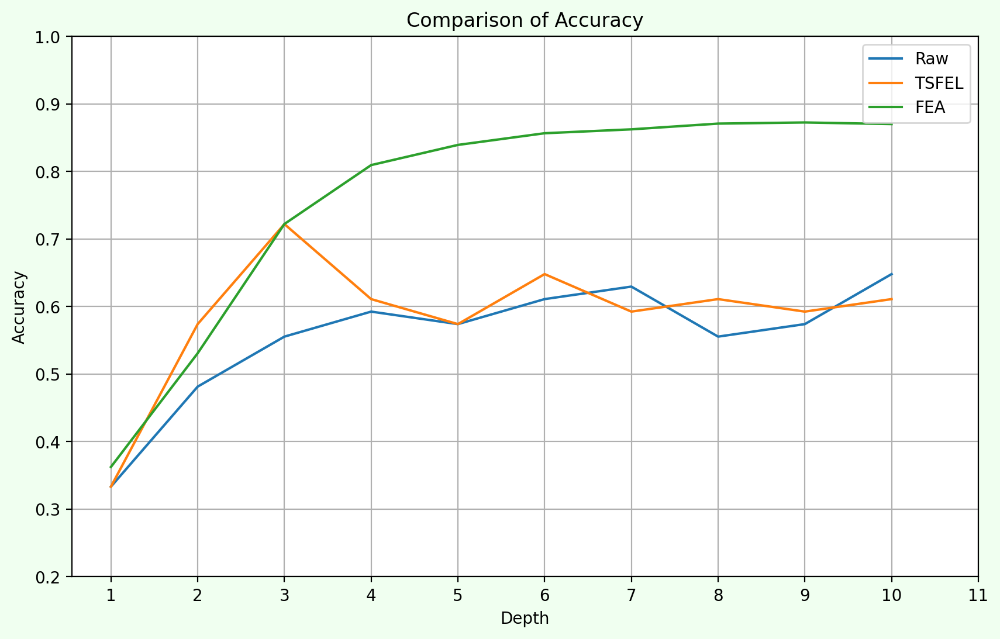

In [61]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.gcf().patch.set_facecolor('honeydew')

ax.plot([i for i in range(1, 11)], all_acc_raw, label='Raw')
ax.plot([i for i in range(1, 11)], all_acc_tsfel, label='TSFEL')
ax.plot([i for i in range(1, 11)], all_acc_fea, label='FEA')

ax.set_xlabel('Depth')
ax.set_ylabel('Accuracy')
ax.set_title('Comparison of Accuracy')


y_ticks = np.linspace(0.2, 1, 9)
ax.set_yticks(y_ticks)
ax.set_xticks(np.linspace(1,11,11))
ax.legend()
ax.grid(True)

plt.ion()

plt.show()
plt.show()

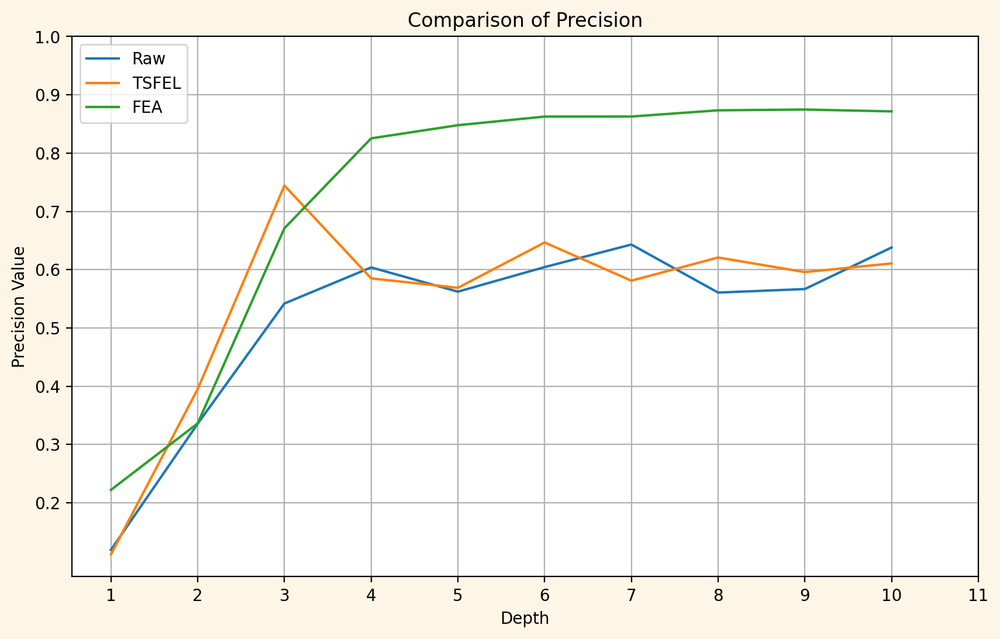

In [62]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.gcf().patch.set_facecolor('oldlace')

ax.plot([i for i in range(1, 11)], all_pre_raw, label='Raw')
ax.plot([i for i in range(1, 11)], all_pre_tsfel, label='TSFEL')
ax.plot([i for i in range(1, 11)], all_pre_fea, label='FEA')

ax.set_xlabel('Depth')
ax.set_ylabel('Precision Value')
ax.set_title('Comparison of Precision')


y_ticks = np.linspace(0.2, 1, 9)
ax.set_yticks(y_ticks)
ax.set_xticks(np.linspace(1,11,11))
ax.legend()
ax.grid(True)

plt.ion()

plt.show()
plt.show()

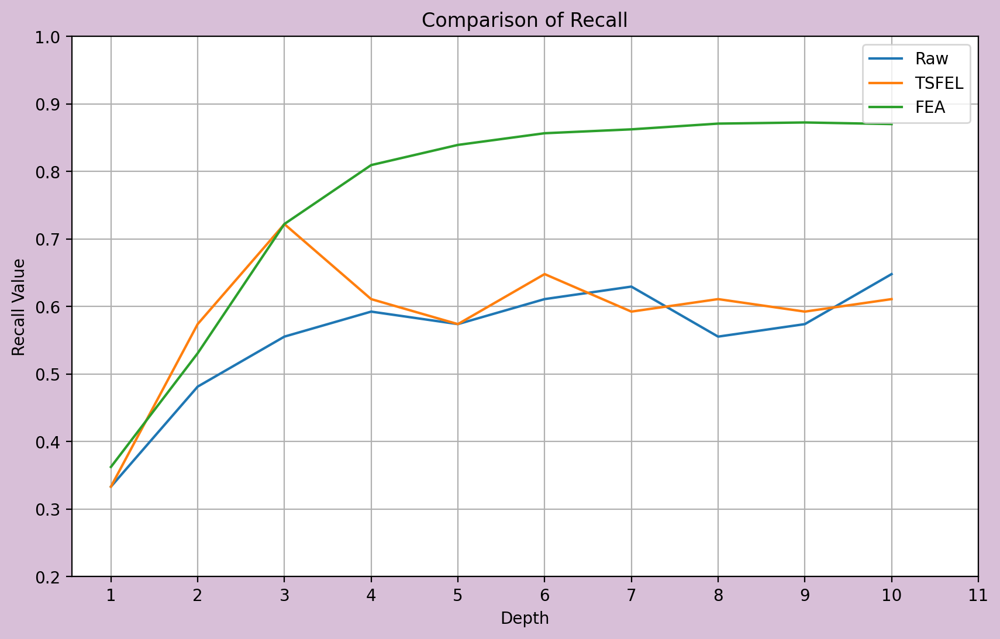

In [63]:

fig, ax = plt.subplots(figsize=(10, 6))
plt.gcf().patch.set_facecolor('thistle')

ax.plot([i for i in range(1, 11)], all_recall_raw, label='Raw')
ax.plot([i for i in range(1, 11)], all_recall_tsfel, label='TSFEL')
ax.plot([i for i in range(1, 11)], all_recall_fea, label='FEA')

ax.set_xlabel('Depth')
ax.set_ylabel('Recall Value')
ax.set_title('Comparison of Recall')


y_ticks = np.linspace(0.2, 1, 9)
ax.set_yticks(y_ticks)
ax.set_xticks(np.linspace(1,11,11))

ax.legend()
ax.grid(True)

plt.ion()

plt.show()
plt.show()

Observing this we can say that, optimal hyperparameter (depth) for the model trained with tsfel features, is equal to 3.

<br><br>**Question 3**<br>Are there any participants/ activitivies where the Model performace is bad? If Yes, Why?


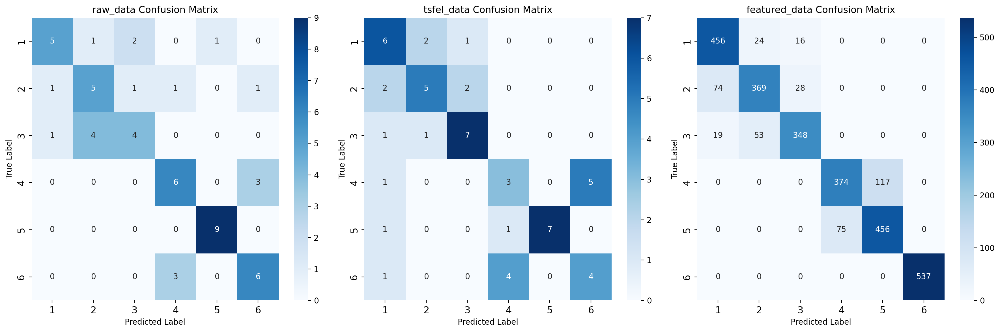

In [64]:
datasets = {
    'raw_data': (dd, y_train, mg_x_test, y_test),
    'tsfel_data': (X_tsfel_df, y_train, X_test_tsfel_df, y_test),
    'featured_data': (X_train_fea, y_train_fea, X_test_fea, y_test_fea)
}

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (data_type, (X_train, y_train, X_test, y_test)) in enumerate(datasets.items()):
    clf = DecisionTreeClassifier(random_state=42)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_test)
    
    conf_matrix = confusion_matrix(y_test, y_pred)
    
    ax = axes[idx]
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    ax.set_title(f'{data_type} Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(),  fontsize=12)

plt.tight_layout()
plt.show()


**These activities (Sitting, Standing, Laying) all involve relatively little movement**, making it challenging for the model to distinguish between them based on accelerometer data alone. Similarly for dynamic activities it is performing poor to predict as **Walking, Walking Upstairs, and Walking Downstairs all involve similar repetitive motions.** There's also some misclassification between Walking Downstairs (3) and the other two walking activities.

In [70]:
for data_type, (X_train, y_train, X_test, y_test) in datasets.items():
    clf = DecisionTreeClassifier(random_state=42)
    clf.fit(X_train, y_train)
    
    y_pred = clf.predict(X_test)

    report = classification_report(y_test, y_pred, output_dict=True)

    print(f"\n{data_type} Metrics:")
    for label, metrics in report.items():
        if label not in ['accuracy','macro avg', 'weighted avg']:
            print(f" {class_labels[int(label)]:2}: P={metrics['precision']:.2f} | R={metrics['recall']:.2f} | F1={metrics['f1-score']:.2f}")
    print("-" * 40)  


raw_data Metrics:
 WALKING: P=0.71 | R=0.56 | F1=0.63
 WALKING_UPSTAIRS: P=0.50 | R=0.56 | F1=0.53
 WALKING_DOWNSTAIRS: P=0.57 | R=0.44 | F1=0.50
 SITTING: P=0.60 | R=0.67 | F1=0.63
 STANDING: P=0.90 | R=1.00 | F1=0.95
 LAYING: P=0.60 | R=0.67 | F1=0.63
----------------------------------------

tsfel_data Metrics:
 WALKING: P=0.50 | R=0.67 | F1=0.57
 WALKING_UPSTAIRS: P=0.62 | R=0.56 | F1=0.59
 WALKING_DOWNSTAIRS: P=0.70 | R=0.78 | F1=0.74
 SITTING: P=0.38 | R=0.33 | F1=0.35
 STANDING: P=1.00 | R=0.78 | F1=0.88
 LAYING: P=0.44 | R=0.44 | F1=0.44
----------------------------------------

featured_data Metrics:
 WALKING: P=0.83 | R=0.92 | F1=0.87
 WALKING_UPSTAIRS: P=0.83 | R=0.78 | F1=0.80
 WALKING_DOWNSTAIRS: P=0.89 | R=0.83 | F1=0.86
 SITTING: P=0.83 | R=0.76 | F1=0.80
 STANDING: P=0.80 | R=0.86 | F1=0.83
 LAYING: P=1.00 | R=1.00 | F1=1.00
----------------------------------------


# Task 3

In [99]:
y_train = y_copy_train
X_tsfel_df.shape,X_test_tsfel_df.shape,y_train.shape,y_test.shape

((126, 100), (54, 100), (126,), (54,))

In [100]:
dd.shape,y_train.shape,mg_x_test.shape,y_test.shape

((126, 500), (126,), (54, 500), (54,))

In [101]:
X_test_fea.shape,y_test_fea.shape,X_train_fea.shape,y_train_fea.shape

((2946, 561), (2946, 1), (7352, 561), (7352, 1))

("./Solution/tree/zero-few_sort.ipynb")

# Task 4

## Pre-processing

In [103]:
lis = []
directory = './Task_4/data/'
for filename in os.listdir(directory):
    if filename.endswith('.csv'):
        df = pd.read_csv(os.path.join(directory, filename))
        df = df.iloc[::8]
        starting = int(df.shape[0]/3)
        # df["acc"] = [df["tgx"],df[]]
        df = df.iloc[starting:starting+500]
        # plt.figure(figsize=(20,12))
        lis.append(np.array(df["TgF"]))
        # print(starting,"   " ,df.shape,"  ",filename)
df = pd.DataFrame(lis)
df

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,0.981,0.985,0.984,0.980,0.982,0.981,0.981,0.983,0.984,0.981,...,1.062,0.972,0.927,0.939,0.974,0.960,0.990,0.983,0.903,0.936
1,1.009,1.002,1.003,1.004,1.001,0.999,0.997,1.004,1.008,1.010,...,1.006,1.011,1.006,1.010,1.009,1.009,1.011,1.009,1.010,1.010
2,1.015,1.024,1.028,1.023,1.020,1.023,1.023,1.026,1.025,1.023,...,1.024,1.022,1.021,1.020,1.023,1.020,1.023,1.020,1.022,1.023
3,1.024,1.024,1.026,1.025,1.026,1.025,1.026,1.025,1.021,1.023,...,1.031,1.030,1.035,1.036,1.032,1.030,1.024,1.024,1.024,1.025
4,0.977,0.980,0.978,0.984,0.980,0.980,0.979,0.981,0.982,0.985,...,0.984,0.983,0.978,0.980,0.984,0.986,0.976,0.979,0.978,0.982
5,0.972,0.974,0.974,0.977,0.978,0.978,0.978,0.977,0.981,0.978,...,0.980,0.980,0.976,0.981,0.976,0.976,0.975,0.975,0.977,0.978
6,0.975,0.979,0.978,0.979,0.980,0.979,0.976,0.979,0.978,0.982,...,0.981,0.977,0.963,0.984,0.982,0.984,0.981,0.976,0.979,0.983
7,0.978,0.979,0.979,0.982,0.981,0.978,0.981,0.981,0.979,0.976,...,0.977,0.979,0.982,0.977,0.980,0.979,0.979,0.975,0.981,0.983
8,0.960,0.959,0.957,0.963,0.967,0.960,0.965,0.958,0.958,0.963,...,0.964,0.962,0.962,0.960,0.960,0.961,0.967,0.966,0.956,0.955
9,0.963,0.952,0.957,0.956,0.955,0.957,0.957,0.956,0.958,0.964,...,0.954,0.957,0.959,0.959,0.957,0.953,0.956,0.960,0.956,0.955


Here we have used every 8th sample reading, as our sampling frequency for recording the data was 400Hz and we're supposed to record it at 50Hz

In [104]:
label = np.array([[6]*4,[4]*4,[5]*4,[1]*4,[3]*4,[2]*4])
df["activity"] = label.flatten()

df = df.sample(frac=1, random_state=42).reset_index(drop=True)

y_rec = df["activity"]
df.drop("activity",axis=1,inplace=True)
y_rec,df

(0     5
 1     3
 2     6
 3     3
 4     5
 5     5
 6     1
 7     6
 8     2
 9     4
 10    6
 11    1
 12    1
 13    6
 14    4
 15    2
 16    3
 17    2
 18    2
 19    4
 20    5
 21    1
 22    3
 23    4
 Name: activity, dtype: int32,
       0      1      2      3      4      5      6      7      8      9    ...  \
 0   0.960  0.959  0.957  0.963  0.967  0.960  0.965  0.958  0.958  0.963  ...   
 1   1.075  0.955  0.977  0.849  0.675  0.459  0.348  0.312  0.347  0.401  ...   
 2   0.981  0.985  0.984  0.980  0.982  0.981  0.981  0.983  0.984  0.981  ...   
 3   1.934  1.274  0.736  0.471  0.367  0.388  0.517  0.563  0.507  0.413  ...   
 4   0.959  0.964  0.964  0.955  0.955  0.958  0.959  0.962  0.957  0.955  ...   
 5   0.963  0.952  0.957  0.956  0.955  0.957  0.957  0.956  0.958  0.964  ...   
 6   1.283  1.292  1.098  0.948  1.321  1.419  1.054  0.985  1.017  0.982  ...   
 7   1.009  1.002  1.003  1.004  1.001  0.999  0.997  1.004  1.008  1.010  ...   
 8   0.946  0.7

**Question 1** <br>Use the Decision Tree model trained on the UCI-HAR dataset to predict the activities that you performed. Report the accuracy, precision, recall and confusion matrix of the model. You have three version of UCI dataset you can use a)Raw data from accelerometer, b)TSFEL featurised data, c)Features provided by author. Choose which version to use, ensuring that your test data is similar to your training data. How did the model perform? 

In [124]:
result(dd,y_train,df,y_rec,None)

Accuracy: 0.3333
Precision: 0.3365
Recall: 0.3333

Confusion Matrix:
[[1 1 1 1 0 0]
 [0 3 1 0 0 0]
 [0 2 2 0 0 0]
 [0 0 0 0 0 4]
 [0 3 0 0 0 1]
 [0 0 1 0 1 2]]

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.25      0.40         4
           2       0.33      0.75      0.46         4
           3       0.40      0.50      0.44         4
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         4
           6       0.29      0.50      0.36         4

    accuracy                           0.33        24
   macro avg       0.34      0.33      0.28        24
weighted avg       0.34      0.33      0.28        24



In [107]:

cfg = tsfel.get_features_by_domain()  

features_list = []

for i in range(df.shape[0]):

     
    X_tsfel_rec = tsfel.time_series_features_extractor(cfg, np.array(df.iloc[i]))
    features_list.append(X_tsfel_rec.values.flatten())
     

tsfel_col_rec = X_tsfel_rec.columns
X_tsfel_df_rec = pd.DataFrame(features_list,columns=tsfel_col_rec)


if X_tsfel_df_rec.shape[1] > 20:
    X_tsfel_df_rec = X_tsfel_df_rec.iloc[:, :100]

*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***


In [125]:
result(X_tsfel_df,y_train,X_tsfel_df_rec,y_rec,None)
# X_tsfel_df.shape,y_train.shape,X_tsfel_df_rec.shape,y_rec.shape

Accuracy: 0.2500
Precision: 0.1417
Recall: 0.2500

Confusion Matrix:
[[4 0 0 0 0 0]
 [3 1 0 0 0 0]
 [1 3 0 0 0 0]
 [0 0 0 1 0 3]
 [0 0 0 2 0 2]
 [2 0 0 2 0 0]]

Classification Report:
              precision    recall  f1-score   support

           1       0.40      1.00      0.57         4
           2       0.25      0.25      0.25         4
           3       0.00      0.00      0.00         4
           4       0.20      0.25      0.22         4
           5       0.00      0.00      0.00         4
           6       0.00      0.00      0.00         4

    accuracy                           0.25        24
   macro avg       0.14      0.25      0.17        24
weighted avg       0.14      0.25      0.17        24



<br>
Here we could only use raw data model or tsfel model (on using tsfel for testing data). The model is performing extremely poor.

In [126]:
df.T.describe().T

,count,mean,std,min,25%,50%,75%,max
0,500.0,0.964306,0.007492,0.908,0.96100,0.9640,0.96800,0.994
1,500.0,1.106292,0.661501,0.063,0.62775,0.9535,1.50200,3.994
2,500.0,0.980394,0.176251,0.210,0.96700,0.9750,0.98400,4.330
3,500.0,1.102956,0.618665,0.127,0.62025,0.9790,1.49700,3.829
4,500.0,0.958820,0.004924,0.936,0.95600,0.9590,0.96200,0.975
5,500.0,0.958564,0.005827,0.921,0.95500,0.9580,0.96200,0.986
6,500.0,1.092618,0.384107,0.360,0.83350,1.0440,1.29575,2.408
7,500.0,1.008778,0.060110,0.785,0.99000,1.0050,1.01900,1.384
8,500.0,1.073010,0.476359,0.197,0.76900,1.0050,1.35300,3.446
9,500.0,0.976868,0.004422,0.947,0.97500,0.9770,0.97900,1.011


**Question 2 :**<br>
Use the data you collected to predict the activities that you performed. Decide whether to apply preprocessing and featurization, and if so, choose the appropriate methods. How did the model perform?

In [127]:
X_train_, X_test_, y_train_, y_test_ = train_test_split(df,y_rec,test_size=0.3,random_state=42)
result(X_train_, y_train_, X_test_, y_test_,None)

Accuracy: 0.2500
Precision: 0.1875
Recall: 0.2500

Confusion Matrix:
[[0 0 0 0 1 0]
 [1 0 0 0 1 0]
 [0 1 0 0 1 0]
 [0 0 0 1 0 0]
 [0 0 0 1 0 0]
 [0 0 0 0 0 1]]

Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         2
           4       0.50      1.00      0.67         1
           5       0.00      0.00      0.00         1
           6       1.00      1.00      1.00         1

    accuracy                           0.25         8
   macro avg       0.25      0.33      0.28         8
weighted avg       0.19      0.25      0.21         8



In [128]:
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_tsfel_df_rec,y_rec,test_size=0.4,random_state=25)
result(X_train_2, y_train_2, X_test_2, y_test_2,7)

Accuracy: 0.3000
Precision: 0.4333
Recall: 0.3000

Confusion Matrix:
[[1 2 0 0 0 0]
 [0 0 0 0 0 1]
 [0 1 0 0 0 0]
 [0 0 0 1 0 0]
 [0 0 0 0 1 0]
 [0 1 0 2 0 0]]

Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.33      0.50         3
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         1
           4       0.33      1.00      0.50         1
           5       1.00      1.00      1.00         1
           6       0.00      0.00      0.00         3

    accuracy                           0.30        10
   macro avg       0.39      0.39      0.33        10
weighted avg       0.43      0.30      0.30        10



Model is performing very poor on both raw data and featurized data as well.

# Not

In [ ]:
grouped_df.sort_values(ascending=False).head(10)

In [ ]:
grouped_df = hyperparameters_df.groupby(['max_depth', 'min_samples_split', 'criterion']).mean()['validation accuracy']
grouped_df

In [ ]:
optimal_hyperparams_raw = grouped_df.idxmax()
optimal_hyperparams_raw

### Part b :  
#### Train a decision tree model using the features obtained by TSFEL. Report the accuracy, precision, recall and confusion matrix of the model.

In [ ]:
# Initialize a list to store the optimal hyperparameters for each validation set
hyperparameters = {}
hyperparameters['max_depth'] = [1,2,3,4,5,6,7,8,9,10]
hyperparameters['min_samples_split'] = [2,3,4,5,6,7,8]
hyperparameters['criteria_values'] = ['gini', 'entropy']
optimal_hyperparameters = {}
test_accuracies = []

# Set the number of subsets and iterations
num_subsets = 5

# Make a pandas dataframe with columns as the hyperparameters, subset number, and validation accuracy
hyperparameters_df = pd.DataFrame(columns=['max_depth', 'min_samples_split', 'criterion', 'subset', 'validation accuracy'])

# Iterate over the subsets
for i in range(num_subsets):
    # Split the data into training and validation sets
    X_train_subset, X_val_subset, y_train_subset, y_val_subset = train_test_split(X_tsfel_df, y_train, test_size=0.285, random_state=i)
    
    # Initialize variables to store the best hyperparameters and accuracy for the current subset
    best_accuracy = 0
    best_hyperparameters = {}
    
    # Iterate over the hyperparameter values

    for max_depth in hyperparameters['max_depth']:
        for min_samples_split in hyperparameters['min_samples_split']:
            for criterion in hyperparameters['criteria_values']:
                # Initialize and train the model with the current hyperparameters
                dt_classifier = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split, criterion=criterion, random_state=42)
                dt_classifier.fit(X_train_subset, y_train_subset)
                
                # Evaluate the model on the validation set
                val_accuracy = dt_classifier.score(X_val_subset, y_val_subset)
                hyperparameters_df.loc[len(hyperparameters_df)] = [max_depth, min_samples_split, criterion, i+1, val_accuracy]
                
                # Update the best accuracy and hyperparameters
                if val_accuracy > best_accuracy:
                    best_accuracy = val_accuracy
                    best_hyperparameters = {
                        'max_depth': max_depth,
                        'min_samples_split': min_samples_split,
                        'criterion': criterion
                    }
    
    optimal_hyperparameters[i] = best_hyperparameters

    # Evaluate the model with the best hyperparameters on the test set
    dt_classifier = DecisionTreeClassifier(max_depth=best_hyperparameters['max_depth'], min_samples_split=best_hyperparameters['min_samples_split'], criterion=best_hyperparameters['criterion'], random_state=42)
    dt_classifier.fit(dd, y_train)
    test_accuracy = dt_classifier.score(mg_x_test, y_test)
    test_accuracies.append(test_accuracy)



print("Optimal hyperparameters for {} inner folds/validation sets".format(num_subsets))
print()
# Print the optimal hyperparameters for each validation set
for i in range(num_subsets):
    print("Optimal hyperparameters for validation set {}: {}".format(i+1, optimal_hyperparameters[i]))
    print("Test Accuracy for validation set {}: {:.4f}".format(i+1, test_accuracies[i]))

In [ ]:
hyperparameters_df

In [ ]:
grouped_df = hyperparameters_df.groupby(['max_depth', 'min_samples_split', 'criterion']).mean()['validation accuracy']
grouped_df

In [ ]:
grouped_df.sort_values(ascending=False).head(10)

In [ ]:
optimal_hyperparams_tsfel = grouped_df.idxmax()
optimal_hyperparams_tsfel

In [34]:

cfg = tsfel.get_features_by_domain()  # Use temporal domain features

# Prepare an empty DataFrame to hold the extracted features
features_list = []

# Loop over each row in the DataFrame
for i in range(mg_x_test.shape[0]):
    # Extract features for the i-th row
    
    X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))

    # Flatten the result and append to the list
    features_list.append(X_tsfel.values.flatten())
     
# Convert the list of feature arrays into a DataFrame
tsfel_col = X_tsfel.columns
X_test_tsfel_df = pd.DataFrame(features_list,columns=tsfel_col)

# If more than 20 features are extracted, select the first 20 features

if X_test_tsfel_df.shape[1] > 20:
    X_test_tsfel_df = X_test_tsfel_df.iloc[:, :100]


*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***
*** Feature extraction started ***


C:\Users\LAKSHYA\AppData\Local\Temp\ipykernel_181776\3252205543.py:10: UserWarning: Using default sampling frequency set in configuration file.
  X_tsfel = tsfel.time_series_features_extractor(cfg, np.array((pd.DataFrame(mg_x_test)).iloc[i]))



*** Feature extraction finished ***


In [ ]:
X_test_tsfel_df.head()

In [ ]:
result(X_tsfel_df,y_train,X_test_tsfel_df,optimal_hyperparams_tsfel)